In [1]:
pip install xarray-spatial -q

Note: you may need to restart the kernel to use updated packages.


In [2]:
from pathlib import Path
from IPython.core.display import Video

import numpy as np
import pandas as pd
import geopandas as gpd  # Vector data handling
import osmnx as ox       # Downloading data from OSM

from shapely.geometry import box
from scipy.spatial import cKDTree as KDTree # For Inverse Distance Weight calculation

import xarray as xr    
import xrspatial    # Hillshading
import rioxarray    # Working with geospatial data in xarray

import matplotlib.pyplot as plt
from datashader.transfer_functions import shade, stack

C:\Users\Ken\.conda\envs\spatial\Lib\site-packages\dask\dataframe\__init__.py:49: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


Obtain DEM Data from the USGS Data Explorer with a focus on the area around Cape Girardeau, Missouri

In [3]:
dem = rioxarray.open_rasterio('USGS_13_n38w090_20230117.tif')

In [4]:
!pip install geojson
import geojson

## Define the area of interest for clipping the raster data

In [5]:
geom = '''{"type": "Polygon",
                "coordinates":[[
                [-89.5464277378,37.0327029788],
                [-89.222117982,37.0327029788],
                [-89.222117982,37.4366526437],
                [-89.5464277378,37.4366526437],
                [-89.5464277378,37.0327029788]]]}'''

In [6]:
# The polygon is converted into a Python object and used to clip the raster data

cropping_geometries = [geojson.loads(geom)]
cropped = dem.rio.clip(geometries=cropping_geometries, crs=4326)

In [7]:
# This reduces the resolution of the clipped raster by averaging over blocks of 3 pixels in both dimensions (x and y).

cropped = cropped.coarsen(x=3, boundary='trim').mean().coarsen(y=3, boundary='trim').mean()

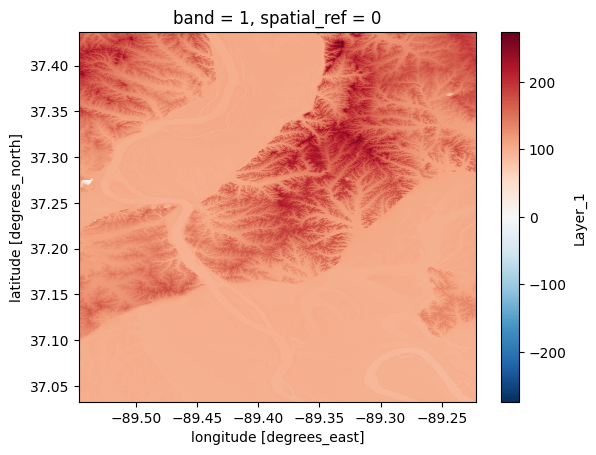

In [8]:
cropped.squeeze().plot.imshow()

## Fetch Coordinates of the River

For this specific case we will be using Mississipi River.
Using its OpenStreetMap (OSM) ID the river geometry is obtained and converted to a GeoDataFrame with
the same coordinate reference system as the DEM

<Axes: >

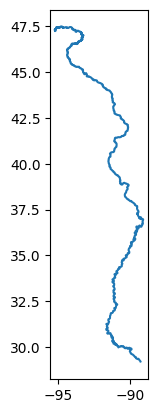

In [9]:
# Mississipi River
osm_id = 'R1756854'

river = ox.geocode_to_gdf(osm_id, by_osmid=True)
river = river.to_crs(dem.rio.crs)

river.plot()

## Cut to Area of Interest

The bounds of the cropped raster and are obtained and used to clip the river geometry to ensure it matches the area of interest

In [10]:
cropped.rio.bounds()

(-89.54629629634545, 37.03287036966892, -89.22231481451543, 37.436574073806895)

In [11]:
bounds = cropped.rio.bounds()
xmin, ymin, xmax, ymax = bounds

In [12]:
river = river.clip(bounds)

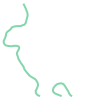

In [13]:
# Access the river geometry and use iloc to select the first row and thn plot it

river_geom = river.geometry.iloc[0]
river_geom

## DEM

Further slice the DEM to focus on the region defined by the river's bounding box

In [14]:
cropped = cropped.sel(y=slice(ymax, ymin), x=slice(xmin, xmax))

<Axes: title={'center': 'band = 1, spatial_ref = 0'}, xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>

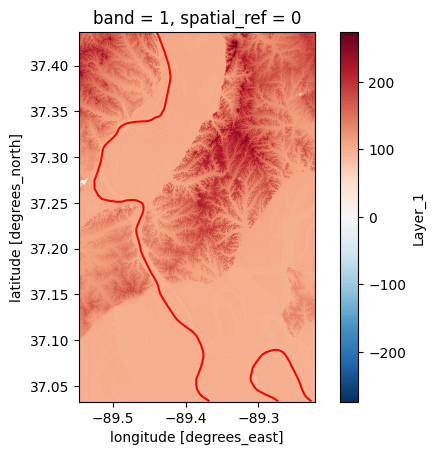

In [15]:
fig, ax = plt.subplots()
cropped.squeeze().plot.imshow(ax=ax)
river.plot(ax=ax, color='red')

## Calculate REM

To calculate the REM, we need to

1.Sample the elevation along the river<br>
2.Interpolate the sampled elevation values to create a 2D elevation raster<br>
3.Subtract the interpolated elevation raster from the DEM<br>

In [16]:
#Extract x and y coordinates from river geometry into xarray DataArrays for further processing

import shapely

def split_coords(geom):
    x = []
    y = []
    for i in shapely.get_coordinates(geom):
        x.append(i[0])
        y.append(i[1])
    return x, y

In [17]:
xs, ys = split_coords(river_geom)
xs, ys = xr.DataArray(xs, dims='z'), xr.DataArray(ys, dims='z')

In [18]:
# Sample elevation values along the river from the cropped DEM using nearest-neighbor interporaltion
sampled = cropped.interp(x=xs, y=ys, method='nearest').dropna(dim='z')

In [19]:
# Check
sampled

<xarray.DataArray (band: 1, z: 158)> Size: 632B
array([[99.533714, 99.50196 , 99.4334  , 99.38284 , 99.32287 , 99.26151 ,
        99.20392 , 99.192665, 99.1871  , 99.11326 , 99.06332 , 98.97504 ,
        98.67312 , 98.62476 , 98.56922 , 98.45252 , 98.4352  , 98.4179  ,
        98.400635, 98.38742 , 98.34036 , 98.2837  , 98.21097 , 98.17755 ,
        98.12829 , 98.04148 , 97.97216 , 97.957794, 97.91221 , 97.90289 ,
        97.879395, 97.850555, 97.83044 , 97.8108  , 97.78903 , 97.75956 ,
        97.73124 , 97.706184, 97.66406 , 97.62763 , 97.62763 , 97.62763 ,
        97.62763 , 97.62763 , 97.62763 , 97.53888 , 97.41321 , 97.24662 ,
        97.24662 , 95.936035, 95.783226, 95.664   , 96.6     , 96.592995,
        96.502525, 96.426735, 96.30039 , 96.30001 , 96.30001 , 96.2898  ,
        96.20811 , 96.13574 , 96.0951  , 96.06698 , 96.0218  , 95.99148 ,
        95.975136, 95.9217  , 95.86605 , 95.841606, 95.811806, 95.801094,
        95.80001 , 95.80001 , 95.80001 , 95.80001 , 95.73135 , 95.71189 ,
        95.69703 , 95.68285 , 95.66044 , 95.53332 , 95.4826  , 95.39391 ,
        95.345055, 95.30741 , 95.19468 , 95.06754 , 94.982796, 94.78019 ,
        94.69999 , 94.69999 , 94.69999 , 94.69999 , 94.66205 , 94.65    ,
        94.6     , 94.6     , 94.6     , 94.58787 , 94.57102 , 94.55001 ,
        94.55001 , 94.55001 , 94.55001 , 94.55001 , 94.48843 , 94.4506  ,
        94.44999 , 94.44999 , 94.44999 , 94.30001 , 94.25427 , 94.073006,
        94.043465, 93.96859 , 93.90954 , 93.880196, 93.83188 , 93.80001 ,
        93.80001 , 93.80001 , 93.77032 , 93.75037 , 90.61517 , 90.56372 ,
        90.456795, 90.35488 , 90.27911 , 90.21743 , 90.19753 , 90.16598 ,
        90.15438 , 90.13958 , 90.132484, 90.12195 , 90.04978 , 90.00329 ,
        89.97747 , 89.9484  , 89.902596, 89.861305, 89.850426, 89.82778 ,
        89.78797 , 89.754616, 89.733864, 89.71818 , 89.70895 , 89.67346 ,
        89.651   , 89.62341 , 89.58027 , 89.5687  , 89.53375 , 89.516884,
        89.50454 , 89.483345]], dtype=float32)
Coordinates:
  * band         (band) int32 4B 1
    spatial_ref  int32 4B 0
    x            (z) float64 1kB -89.44 -89.44 -89.43 ... -89.24 -89.24 -89.23
    y            (z) float64 1kB 37.43 37.43 37.42 37.42 ... 37.04 37.04 37.04
Dimensions without coordinates: z
Attributes:
    BandDefinitionKeyword:  *
    DataType:               *
    AREA_OR_POINT:          Area
    DESCRIPTION:            *
    LAYER_TYPE:             athematic
    RepresentationType:     *
    scale_factor:           1.0
    add_offset:             0.0
    long_name:              Layer_1
    _FillValue:             -999999.0

 Prepare arrays of coordinates for both sampled points along the river and all points in the original DEM for interpolation

In [20]:
# Create a 2D array of sampled river coordinates (x, y) from the elevation data
c_sampled = np.vstack([sampled.coords[c].values for c in ('x', 'y')]).T

# Retrieve all (x, y) coordinates from the original cropped DEM
c_x, c_y = [cropped.coords[c].values for c in ('x', 'y')]

# Generate a grid of all possible (x, y) coordinate pairs for interpolation
# np.meshgrid creates two 2D arrays from the 1D coordinate arrays c_x and c_y
# np.dstack stacks these arrays along a new axis, and reshape flattens it into a 2D array
c_interpolate = np.dstack(np.meshgrid(c_x, c_y)).reshape(-1, 2)

# Extract the sampled elevation values from the 'sampled' DataArray and flatten into a 1D array
values = sampled.values.ravel()

In [21]:
c_interpolate

array([[-89.54625   ,  37.43652778],
       [-89.54597222,  37.43652778],
       [-89.54569444,  37.43652778],
       ...,
       [-89.22291667,  37.03291667],
       [-89.22263889,  37.03291667],
       [-89.22236111,  37.03291667]])

## Inverse Distanxe Weighting(IDW) Interpolation

A KDTree is built from the sampled coordinates to perform IDW interpolation on all points in the DEM grid.
Distances and weights are calculated based on nearby sampled values to create an interpolated elevation raster.

In [22]:
tree = KDTree(c_sampled)

In [23]:
# IWD interpolation
distances, indices = tree.query(c_interpolate, k=50)

weights = 1 / distances
weights = weights / weights.sum(axis=1).reshape(-1, 1)

interpolated_values = (weights * values[indices]).sum(axis=1)

In [24]:
interpolated_values

array([98.24388732, 98.24430653, 98.24472796, ..., 90.30985072,
       90.3143536 , 90.3187768 ])

In [25]:
elevation_raster = xr.DataArray(
    interpolated_values.reshape((len(c_y), len(c_x))).T, dims=('x', 'y'), coords={'x': c_x, 'y': c_y}
)

<Axes: xlabel='x', ylabel='y'>

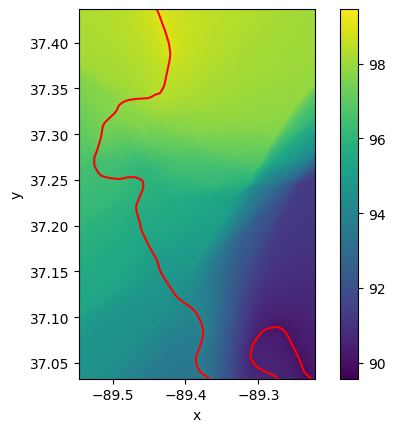

In [26]:
# The interpolated elevation raster is plotted alongside the river geometry for visual comparison
fig, ax = plt.subplots()
elevation_raster.transpose().plot.imshow(ax=ax)
river.plot(ax=ax, color='red')

## Calculating Relative Elevation Model(REM)

In [27]:
# The REM is calculated by subtracting the interpolated elevation from the cropped DEM
rem = cropped - elevation_raster

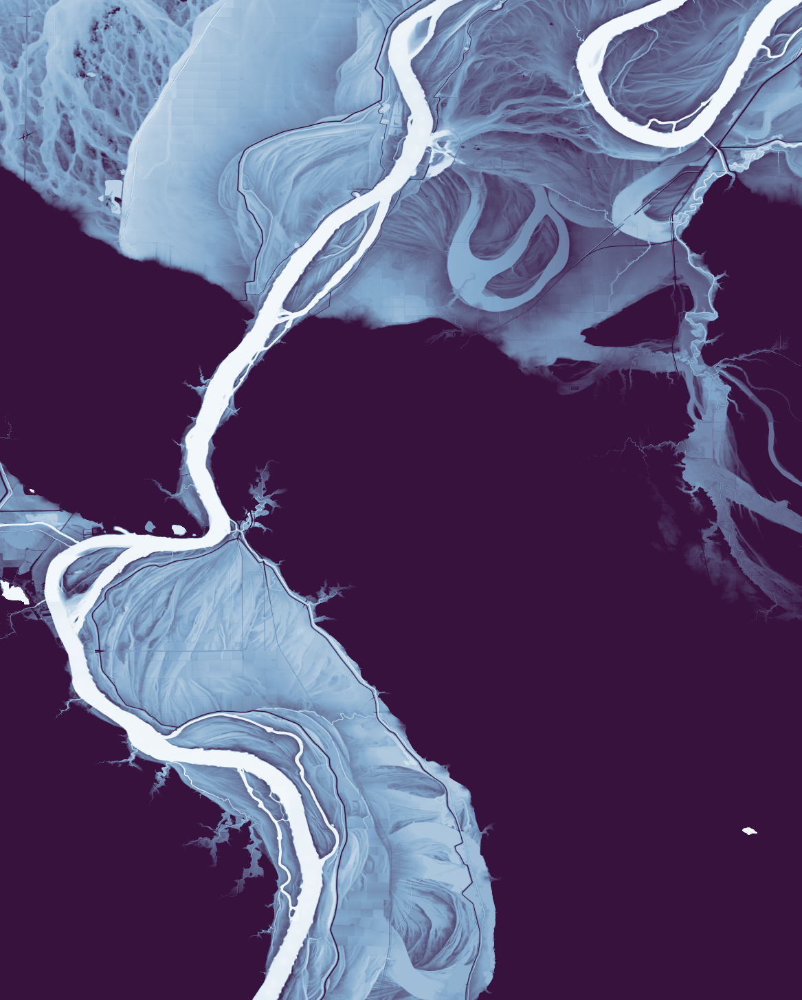

In [28]:
# Color scheme set up for visualizing the raster dataset
colors = ['#f2f7fb', '#81a8cb', '#37123d']
shade(rem.squeeze(), cmap=colors, span=[0, 10], how='linear')

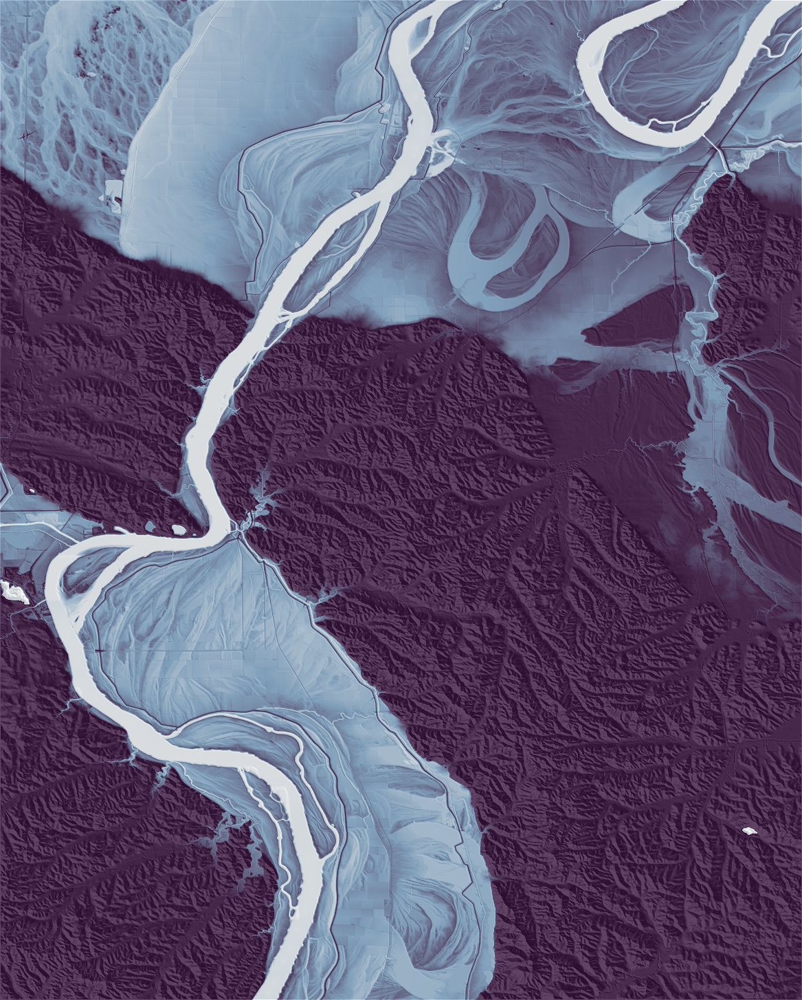

In [29]:
# Generation of hillshade representaion of the cropped raster data
a = shade(xrspatial.hillshade(cropped.squeeze(), angle_altitude=1, azimuth=310), cmap=['black', 'white'], how='linear')

# Application of shading to the REM
b = shade(rem.squeeze(), cmap=colors, span=[0, 10], how='linear', alpha=200)

# Stacking of the two images into a single composite image
stacked_image =stack(a, b)
stacked_image